# Genotype principal components in GTEx
> Required for developing double-KNN correction

- toc: true 
- badges: true
- comments: true

# Setup

This notebook requires:   
  1. LD filtered genotype
  2. Eigenvectors file from EIGENSOFT
  3. Gene expression matrix

## Load data

In [1]:
#collapse-hide
dosagefile = '/cbscratch/sbanerj/gtex_pca/gtex_v8_filtered.dosage.raw'
dosage_numpy_file = '/cbscratch/sbanerj/gtex_pca/gtex_dosage.npy'
eigensoft_file = '/cbscratch/sbanerj/gtex_pca/GTEX_v8_2020-02-21_WGS_838Indiv_Freeze_SHAPEIT2_phased_NoMissingGT_SNPfilter_MAF0.05_allchr_ldpruned.pca.evec'
expression_file = '/scratch/sbanerj/trans-eqtl/input/gtex_v8/expression/gtex_ms_raw_std_protein_coding_lncRNA.txt'

## Load Python libraries

In [2]:
#collapse-hide
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from scipy import stats
import os

import matplotlib.pyplot as plt
import matplotlib
from mpl_toolkits.axes_grid1 import make_axes_locatable
from utils import mpl_stylesheet
mpl_stylesheet.banskt_presentation(fontfamily = 'latex-clearsans', fontsize = 18, colors = 'banskt', dpi = 300)

## Read input data

In [3]:
#collapse-hide
if not os.path.isfile(dosage_numpy_file):
    dosage = np.loadtxt(dosagefile, delimiter=' ', skiprows=1, usecols=range(6, 97612))
    np.save(dosage_numpy_file, dosage)
else:
    dosage = np.load(dosage_numpy_file)
gtcent = dosage - np.mean(dosage, axis = 0).reshape(1, -1)
gtsamples = list()
with open (dosagefile, 'r') as infile:
    next(infile)
    for line in infile:
        gtsamples.append(line.strip().split()[1])

## Core functionalities

In [4]:
#collapse-hide
def get_pca(x, K):
    pca = PCA(n_components=K)
    pca.fit(x) # requires N x P (n_samples, n_features)
    x_pca = pca.transform(x)
    return pca, x_pca

def get_distance(a, b):
    return np.linalg.norm(a - b)

def distance_matrix(x_pca):
    nsample = x_pca.shape[0]
    distance_matrix = np.zeros((nsample, nsample))
    for i in range(nsample):
        for j in range(i+1, nsample):
            dist = get_distance(x_pca[i,:], x_pca[j,:])
            distance_matrix[i, j] = dist
            distance_matrix[j, i] = dist
    return distance_matrix

def map_distance_matrix(dm, samples, target_samples):
    N = len(target_samples)
    newdm = np.zeros((N, N))
    newdm[:] = np.nan
    for i in range(N):
        if target_samples[i] in samples:
            newdm[i, i] = 0 # diagonal is always zero
            iold = samples.index(target_samples[i])
            for j in range(i+1, N):
                if target_samples[j] in samples:
                    jold = samples.index(target_samples[j])
                    newdm[i, j] = dm[iold, jold]
                    newdm[j, i] = dm[jold, iold]
    return newdm

## Compare EIGENSOFT with Python PCA.

Note that PC = eigenvector * signgular value

In [5]:
#collapse-hide
eigensoft_evec = np.loadtxt(eigensoft_file, skiprows = 0, usecols = range(1, 21))
eigensoft_sval = np.array([float(x) for x in open(eigensoft_file).readline().rstrip().split()[1:]])
pca_obj, gtpca = get_pca(gtcent, 20)

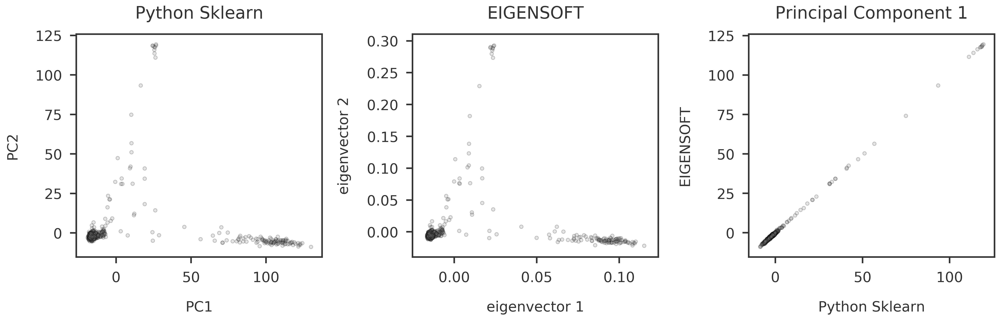

In [6]:
mpl_stylesheet.banskt_presentation(fontfamily = 'latex-clearsans', fontsize = 18, colors = 'banskt', dpi = 300)
fig = plt.figure(figsize = (18, 6))
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

ax1.scatter(gtpca[:, 0], gtpca[:, 1], 
            s = 20, marker = 'o', edgecolor = 'black', color = 'gray', alpha = 0.2)
ax1.set_xlabel("PC1")
ax1.set_ylabel("PC2")
ax1.set_title("Python Sklearn", pad = 20)

ax2.scatter(eigensoft_evec[:, 0], eigensoft_evec[:, 1],
            s = 20, marker = 'o', edgecolor = 'black', color = 'gray', alpha = 0.2)
ax2.set_xlabel("eigenvector 1")
ax2.set_ylabel("eigenvector 2")
ax2.set_title("EIGENSOFT", pad = 20)


k = 1
ax3.scatter(gtpca[:, k], eigensoft_evec[:, k] * pca_obj.singular_values_[k], 
            s = 20, marker = 'o', edgecolor = 'black', color = 'gray', alpha = 0.2)
ax3.set_xlabel("Python Sklearn")
ax3.set_ylabel("EIGENSOFT")
ax3.set_title(f'Principal Component {k}', pad = 20)

plt.tight_layout()
plt.show()

# Double KNN correction

## Number of PCs for reducing dimension

I need to reduce the dimensionality of the genotype matrix for calculating distance matrix between samples in the reduced dimension of the genotype space.  
It might be interesting to check how the target dimension $D$ affects the distance matrix. Here, we checked $D=20$ and $D=40$

In [7]:
#collapse-hide
pcagt20_obj, gtpca_20 = get_pca(gtcent, 20)
pcagt40_obj, gtpca_40 = get_pca(gtcent, 40)
dm20 = distance_matrix(gtpca_20)
dm40 = distance_matrix(gtpca_40)

I clustered the distance matrix calculated with $D=20$.

In [8]:
from scipy.cluster import hierarchy as hc
link = hc.linkage(dm20, method='centroid')
o1 = hc.leaves_list(link)

/usr/users/sbanerj/miniconda3/envs/py36/lib/python3.7/site-packages/ipykernel_launcher.py:2: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  


In [9]:
mgt20 = dm20[o1,:][:,o1]
mgt40 = dm40[o1,:][:,o1]

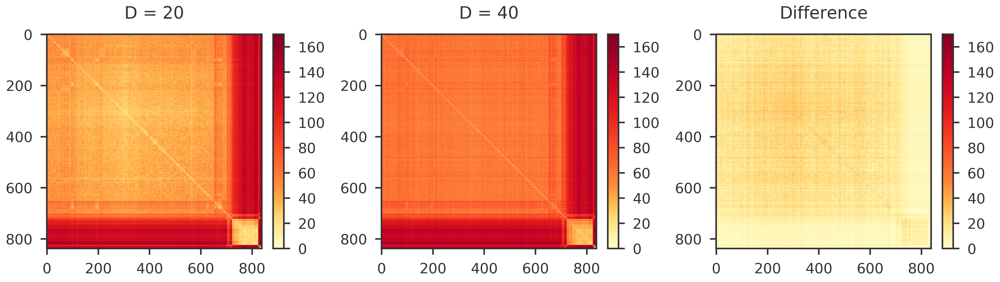

In [10]:
fig = plt.figure(figsize = (18, 6))
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

norm = matplotlib.colors.DivergingNorm(vmin=0, vcenter=50., vmax=170.)
cmap = plt.get_cmap("YlOrRd")

im1 = ax1.imshow(mgt20, cmap=cmap, norm = norm, interpolation='nearest')
im2 = ax2.imshow(mgt40, cmap=cmap, norm = norm, interpolation='nearest')
im3 = ax3.imshow(np.abs(mgt20 - mgt40), cmap = cmap, norm = norm, interpolation='nearest')

divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.2)
cbar = plt.colorbar(im1, cax=cax, fraction = 0.1)

divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.2)
cbar = plt.colorbar(im2, cax=cax, fraction = 0.1)

divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.2)
cbar = plt.colorbar(im3, cax=cax, fraction = 0.1)

ax1.set_title("D = 20", pad = 20)
ax2.set_title("D = 40", pad = 20)
ax3.set_title("Difference", pad = 20)

plt.tight_layout()
#plt.savefig('../plots/gtex_samples_in_genotype_space.png', bbox_inches='tight')
plt.show()

## Variance explained by the eigenvectors

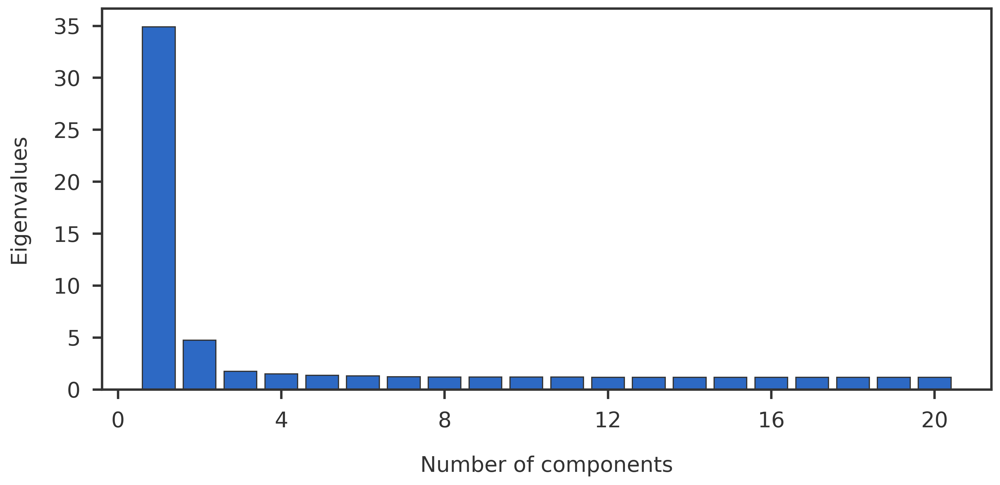

In [11]:
#collapse-hide
fig = plt.figure(figsize = (12, 6))
ax1 = fig.add_subplot(111)
ax1.bar(np.arange(1, 21), eigensoft_sval)
ax1.set_xlabel('Number of components')
ax1.set_ylabel('Eigenvalues')
ax1.set_xticks(list(range(0, 21, 4)))
plt.tight_layout()
#plt.savefig('../plots/gtex_genotype_pc_explained_variance.png', bbox_inches='tight')
plt.show()

## Relationship with sample distance in expression spaces

### Read GTEx gene expression

In [12]:
#collapse-hide
def read_gtex(filename): # returns N x G gene expression
    expr_list = list()
    donor_list = list()
    gene_list = list()
    with open(filename) as mfile:
        donor_list = mfile.readline().strip().split("\t")[1:]
        for line in mfile:
            linesplit = line.strip().split("\t")
            gene = linesplit[0].strip()
            gene_list.append(gene)
            expr = np.array([float(x) for x in linesplit[1:]])
            expr_list.append(expr)
    expr = np.transpose(np.array(expr_list))
    return expr, donor_list, gene_list

In [13]:
gx, gxsamples, genelist = read_gtex(expression_file)

### Reduce dimension

For the genes, I reduced dimension $D' = N, 20, 40$ where $N$ is the number of samples

In [14]:
_, gxpca_n = get_pca(gx, gx.shape[0])
_, gxpca_20 = get_pca(gx, 20)
_, gxpca_40 = get_pca(gx, 40)

In [15]:
dmgxN = distance_matrix(gxpca_n)
dmgx20 = distance_matrix(gxpca_20)
dmgx40 = distance_matrix(gxpca_40)

In [16]:
target_samples = [gtsamples[x] for x in o1]
mgxN = map_distance_matrix(dmgxN, gxsamples, target_samples)
mgx20 = map_distance_matrix(dmgx20, gxsamples, target_samples)
mgx40 = map_distance_matrix(dmgx40, gxsamples, target_samples)

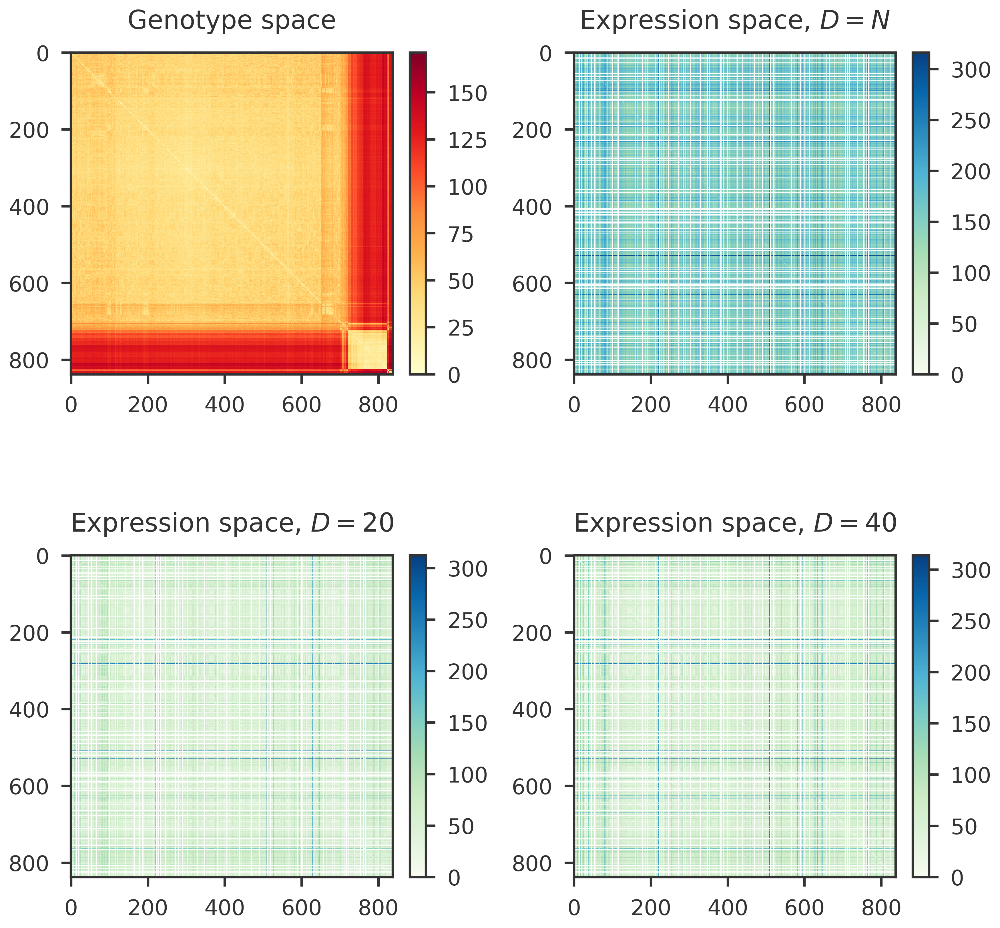

In [17]:
fig = plt.figure(figsize = (12, 12))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)

norm1 = matplotlib.colors.DivergingNorm(vmin=0, vcenter=50., vmax=170.)
cmap1 = plt.get_cmap("YlOrRd")

norm2 = norm2 = matplotlib.colors.DivergingNorm(vmin=0., vcenter=75., vmax=300.)
cmap2 = plt.get_cmap("GnBu")
#cmap2.set_bad('paleturquoise')
cmap2.set_bad('w')

im1 = ax1.imshow(mgt20, cmap = cmap1, interpolation='nearest')
im2 = ax2.imshow(mgxN, cmap = cmap2, interpolation='nearest')
im3 = ax3.imshow(mgx20, cmap = cmap2, interpolation='nearest')
im4 = ax4.imshow(mgx40, cmap = cmap2, interpolation='nearest')

for axi, imi in zip([ax1, ax2, ax3, ax4], [im1, im2, im3, im4]):
    divider = make_axes_locatable(axi)
    cax = divider.append_axes("right", size="5%", pad=0.2)
    cbar = plt.colorbar(imi, cax=cax, fraction = 0.1)


ax1.set_title("Genotype space", pad = 20)
for axi, dim in zip([ax2, ax3, ax4], ['N', '20', '40']):
    axi.set_title(f"Expression space, $D = {dim}$", pad = 20)

plt.tight_layout()
#plt.savefig('../plots/gtex_samples_in_expression_space.png', bbox_inches='tight')
plt.show()